In [1]:
import sys
sys.path.append("../src")
from utils import *

In [2]:
adata_atlas = sc.read("/data/projects/robin/singlecell/kidney/Lake/cellxgene_obj.h5ad")

In [3]:
adata_atlas.X.max()

9.090837

In [4]:
adata = adata_atlas.raw.to_adata()
adata.layers["logcounts"] = adata_atlas.X.copy()

In [5]:
adata.var = adata.var.set_index("feature_name")

/opt/conda/lib/python3.9/site-packages/anndata/_core/anndata.py:782: UserWarning: 
AnnData expects .var.index to contain strings, but got values like:
    ['A1BG', 'A1BG-AS1', 'A1CF', 'A2M', 'A2M-AS1']

    Inferred to be: categorical

  value_idx = self._prep_dim_index(value.index, attr)


In [6]:
adata = adata[adata.obs["condition.long"] == "Normal Reference"]

In [7]:
experiments = adata.obs["experiment"].value_counts()[(adata.obs["experiment"].value_counts()>25).tolist()].index.tolist()

In [8]:
adata = adata[adata.obs["experiment"].isin(experiments)]

In [9]:
adata_imm = adata[adata.obs["subclass.l1"]=="IMM"]
adata_tis = adata[adata.obs["subclass.l1"]!="IMM"]

In [10]:
subsets = adata.obs["subclass.l2"].value_counts()[(adata.obs["subclass.l2"].value_counts()>25).tolist()].index.tolist()

In [11]:
adata_imm = adata_imm[adata_imm.obs["subclass.l2"].isin(subsets)]

In [12]:
adata_imm.obs = adata_imm.obs[["experiment", "subclass.l2"]]
adata_imm.obs["cell_type_broad"] = "Immune"
adata_tis.obs = adata_tis.obs[["experiment", "subclass.l1"]]
adata_tis.obs["cell_type_broad"] = adata_tis.obs["subclass.l1"].copy()

/opt/conda/lib/python3.9/site-packages/anndata/_core/anndata.py:117: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/opt/conda/lib/python3.9/site-packages/anndata/_core/anndata.py:117: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [13]:
col_names = ["batch", "cell_type", "cell_type_broad"]
adata_imm.obs.columns = col_names
adata_tis.obs.columns = col_names

In [14]:
adata_c = adata_imm.concatenate(adata_tis)

/opt/conda/lib/python3.9/site-packages/anndata/_core/anndata.py:1755: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(


In [15]:
sc.set_figure_params(dpi=100)

In [16]:
from matplotlib import font_manager

font_dirs = "/usr/share/fonts/truetype/msttcorefonts/"
font_files = font_manager.findSystemFonts(fontpaths=font_dirs)

# custom_font_manager = matplotlib.font_manager.FontManager()
for font_file in font_files:
    font_manager.fontManager.addfont(font_file)

In [17]:
import matplotlib

matplotlib.pyplot.rcParams['font.family'] = "arial"
# matplotlib.pyplot.rcParams['font.weight'] = "regular"

matplotlib.pyplot.rcParams['figure.dpi'] = 100
matplotlib.pyplot.rcParams['figure.figsize'] = [5,5]

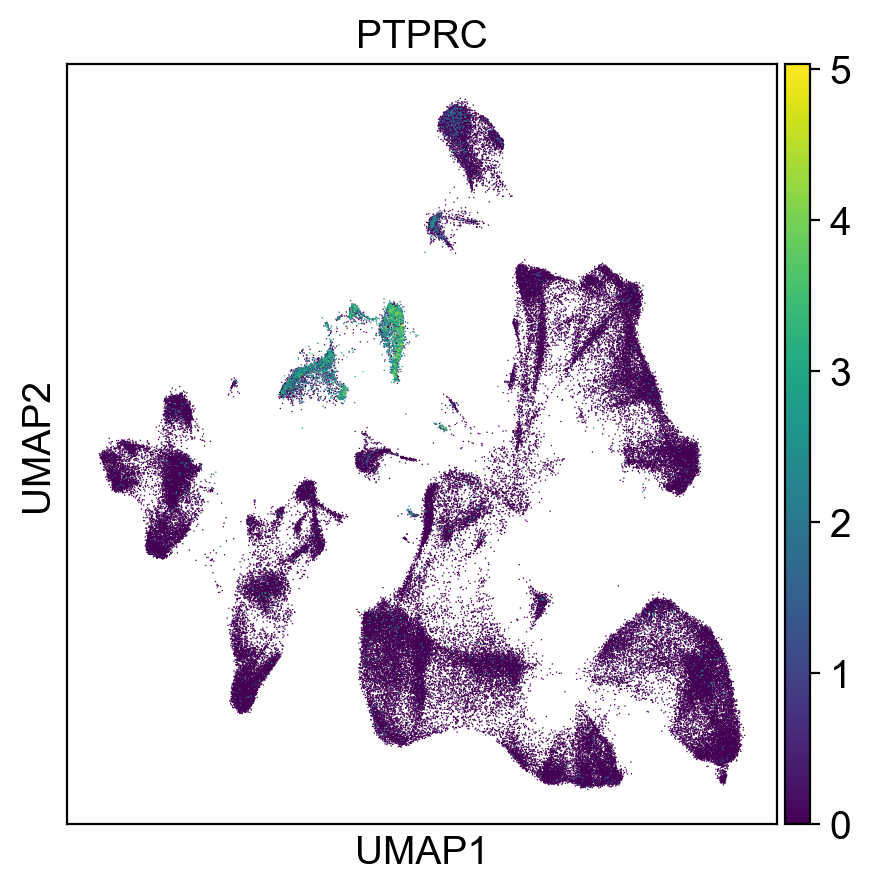

In [18]:
sc.pl.umap(adata_c, color="PTPRC", legend_loc="on data", layer="logcounts")

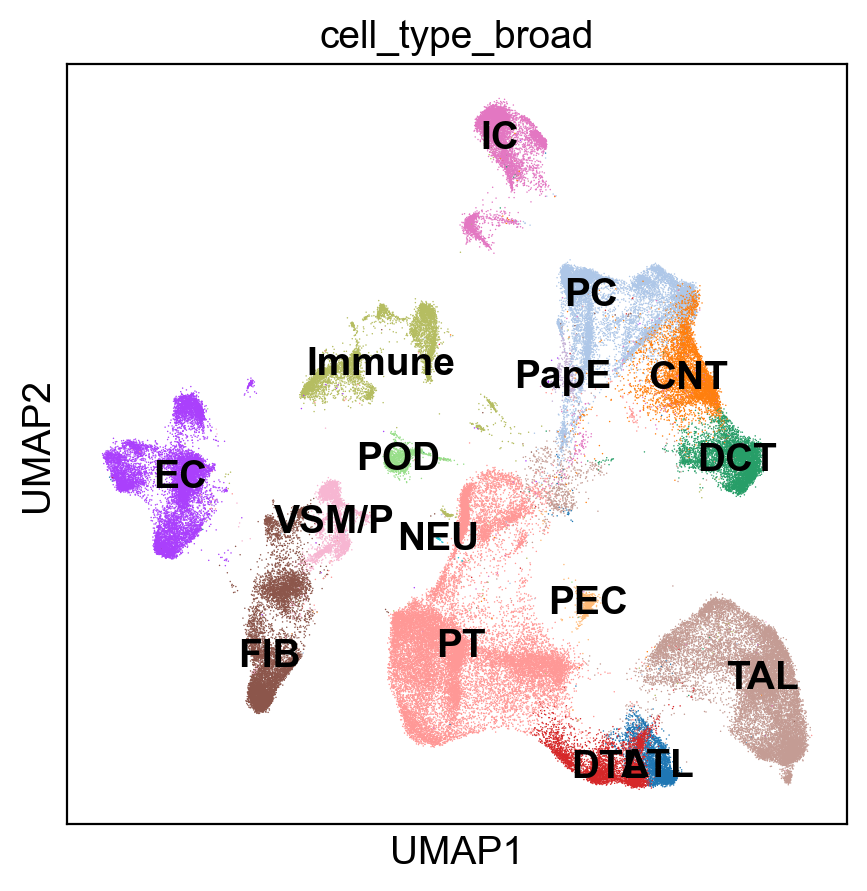

In [19]:
sc.pl.umap(adata_c, color="cell_type_broad", legend_loc="on data")

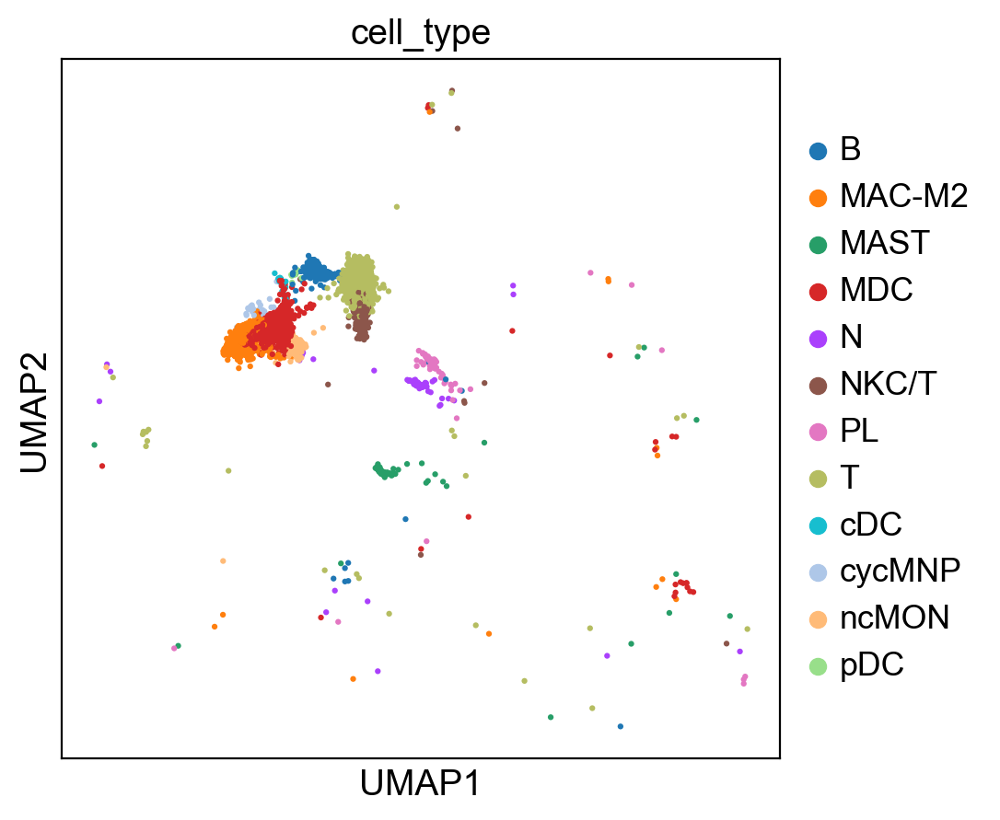

In [20]:
sc.pl.umap(adata_imm, color="cell_type")

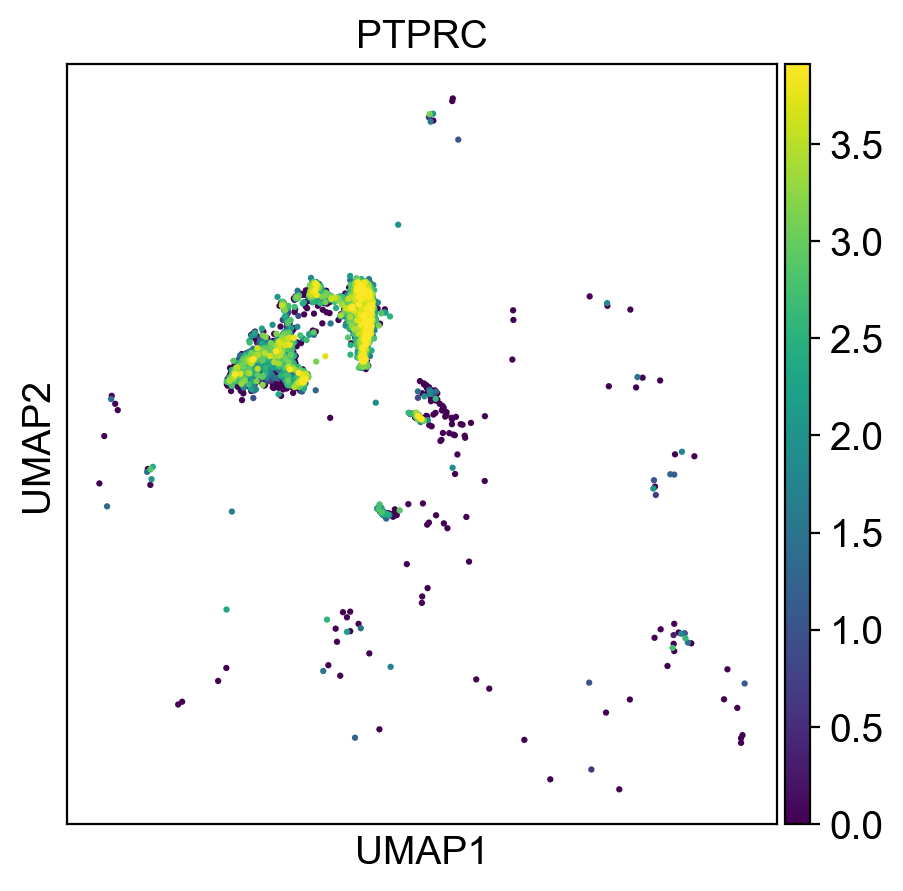

In [21]:
sc.pl.umap(adata_imm, color="PTPRC", layer="logcounts", vmax="p99")

In [22]:
adata_imm1 = adata_imm[adata_imm.to_df()["PTPRC"]>1.5]

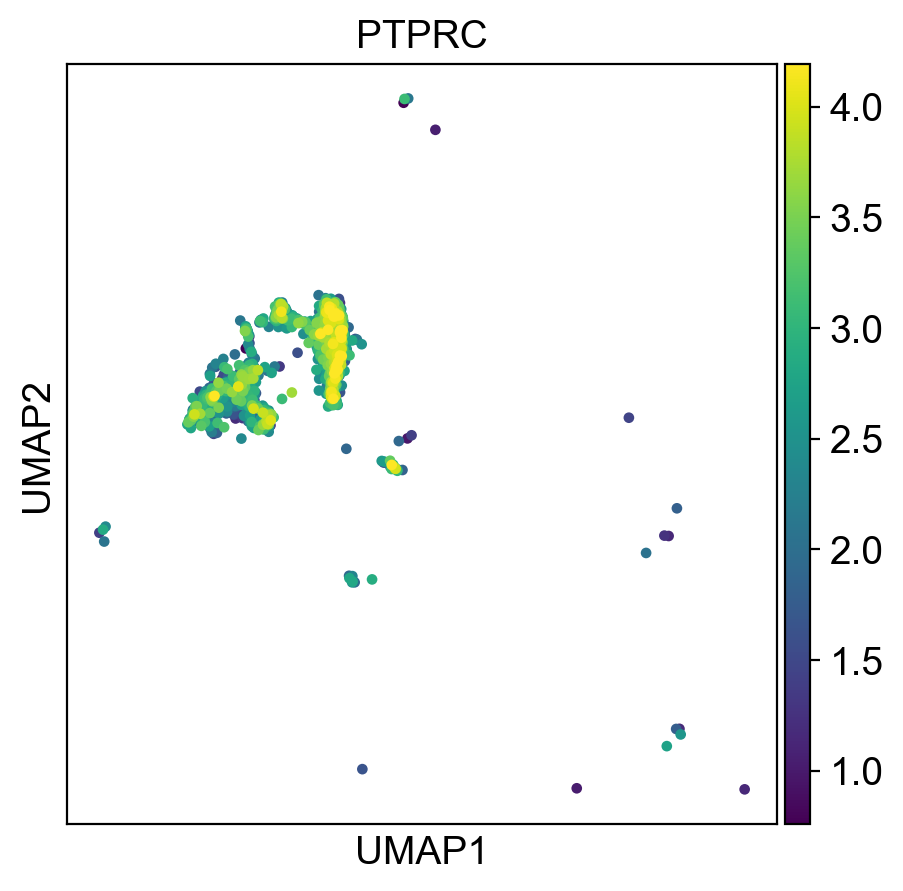

In [23]:
sc.pl.umap(adata_imm1, color="PTPRC", layer="logcounts", vmax="p99")

In [24]:
adata_imm1.obs["cell_type"].value_counts()

T         759
MDC       368
NKC/T     289
MAC-M2    257
ncMON     149
B         124
N          28
cDC        27
cycMNP     17
MAST        8
pDC         6
PL          3
Name: cell_type, dtype: int64

In [25]:
rm_subsets = ["cycMNP", "MAST", "pDC", "PL"]

In [26]:
adata_imm1 = adata_imm1[~adata_imm1.obs["cell_type"].isin(rm_subsets)]

In [27]:
adata_c = adata_imm1.concatenate(adata_tis)

/opt/conda/lib/python3.9/site-packages/anndata/_core/anndata.py:1755: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(


<AxesSubplot:title={'center':'cell type'}, xlabel='UMAP1', ylabel='UMAP2'>

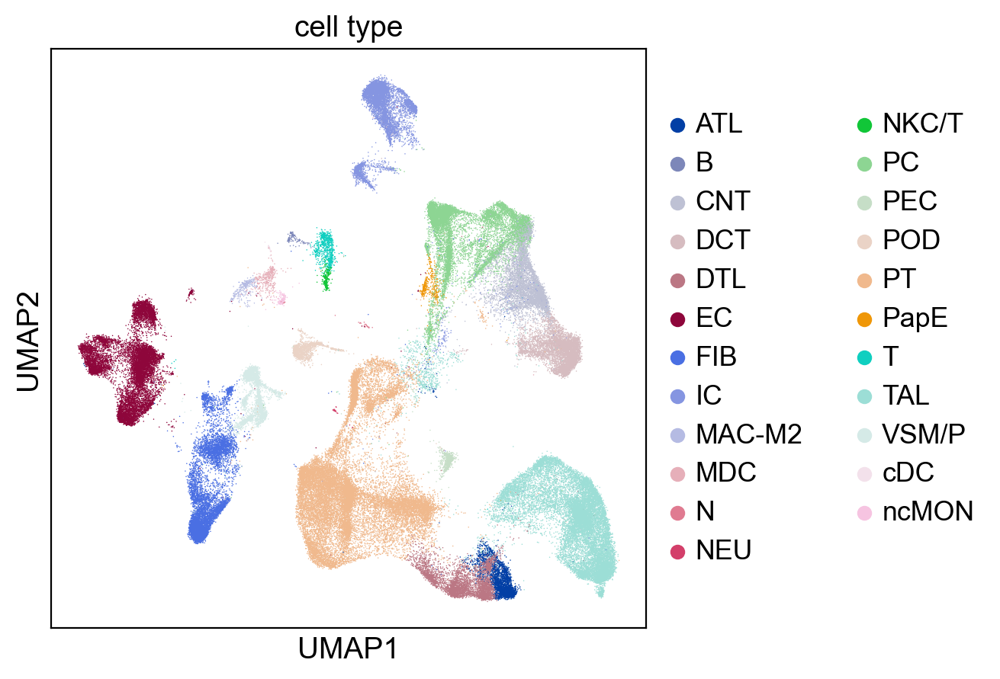

In [28]:
sc.pl.umap(adata_c, color="cell_type", title="cell type", show=False)

In [29]:
genes = [gene for gene in adata_c.var_names.tolist() if gene in adata_c.obs["cell_type"].unique()]
genes

['DCT', 'DTL', 'PC']

In [30]:
mapping = {"NKC/T": "NK_T",
           "VSM/P": "VSM_P",
           "DCT": "DCT_ct",
          "DTL": "DTL_ct",
          "PC": "PC_ct"}
adata_c.obs["cell_type"].replace(mapping, inplace=True)

In [31]:
adata_c = adata_c[adata_c.obs["cell_type"]!="T"]

<AxesSubplot:title={'center':'cell type'}, xlabel='UMAP1', ylabel='UMAP2'>

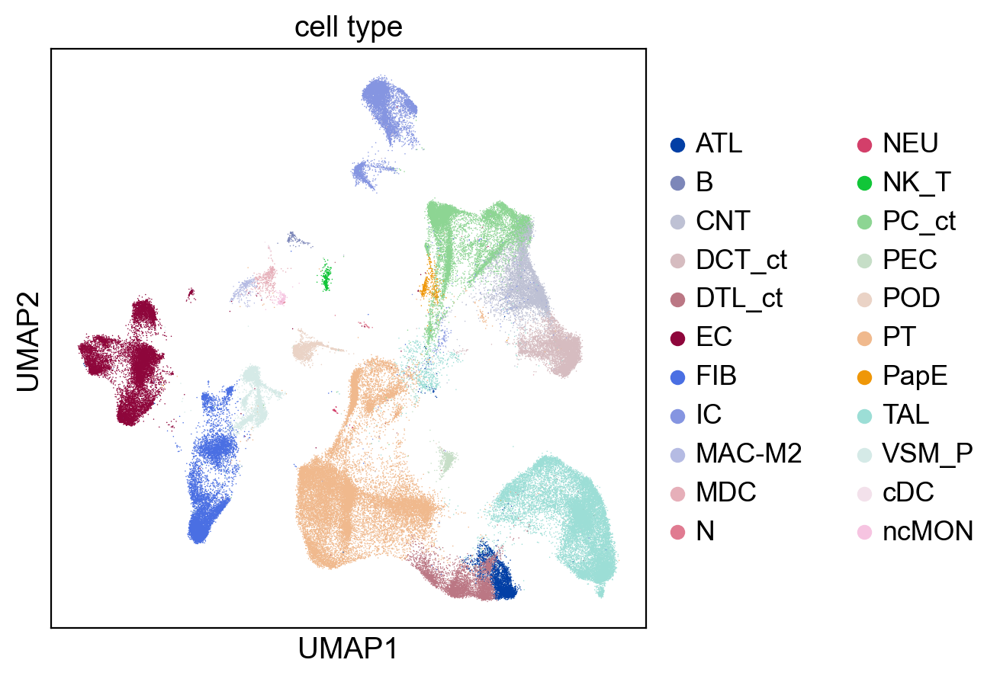

In [32]:
sc.pl.umap(adata_c, color="cell_type", title="cell type", show=False)

In [33]:
import muon as mu

In [34]:
adata_tcell = mu.read("/data/projects/dschaub/anca-project/data/anca/exploratory/ANCA_27PK27PB_T_harmony_r_annotated_merged.h5mu")

/opt/conda/lib/python3.9/site-packages/mudata/_core/mudata.py:491: UserWarning: Cannot join columns with the same name because var_names are intersecting.
  warnings.warn(


In [35]:
adata_rna = adata_tcell["rna"]
adata_rna = adata_rna[adata_rna.obs.tissue=="K"]

In [36]:
adata_rna.obs["cell_type_v1_merged"].value_counts()

NKT/CTL             2672
Tc1-like            2663
Th1-like            2450
Th1                 2175
stressed T cells    1929
Th17                1759
Tc1                 1707
Tfh                 1601
Treg                1155
Tc17-like            965
MAIT                 597
CD4+ Tcm             565
CD8+ Tem             536
CD4+ naive           501
gdT                  248
NK                   247
NKT                  209
CD4+/CD8+ Tcm        100
CD8+ naive            69
Prolif.               38
Name: cell_type_v1_merged, dtype: int64

In [37]:
keep_subsets = ["Th1", "Th1-like", "Th17", "Tfh", "gdT", "MAIT", "Treg", "Tc1", "Tc1-like", "Tc17", "Tc17-like", "CD4+ naive", "CD8+ naive", 
                "CD4+ Tcem", "CD8+ Tem", "Prolif."]

In [38]:
adata_rna = adata_rna[adata_rna.obs["cell_type_v1_merged"].isin(keep_subsets)]

In [39]:
mapping = {"Tc1-like": "Tc1",
           "Th1-like": "Th1",
           "Tc17-like": "Tc17"}

adata_rna.obs["cell_type_v1_merged"].replace(mapping, inplace=True)

In [40]:
adata_rna.obs["cell_type_v1_merged"].value_counts()


Th1           4625
Tc1           4370
Th17          1759
Tfh           1601
Treg          1155
Tc17           965
MAIT           597
CD8+ Tem       536
CD4+ naive     501
gdT            248
CD8+ naive      69
Prolif.         38
Name: cell_type_v1_merged, dtype: int64

In [41]:
adata_rna.obs["experiment"] = adata_rna.obs["sample"].copy()
adata_rna.obs["cell_type"] = adata_rna.obs["cell_type_v1_merged"].copy()

/tmp/ipykernel_58477/3301938797.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_rna.obs["experiment"] = adata_rna.obs["sample"].copy()


In [42]:
adata_rna.X = adata_rna.layers["counts"].copy()

In [43]:
adata_rna.obs = adata_rna.obs[["experiment", "cell_type"]]

In [44]:
adata_c_1 = adata_c.concatenate(adata_rna)

/opt/conda/lib/python3.9/site-packages/anndata/_core/anndata.py:1755: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(


<AxesSubplot:title={'center':'cell type'}, xlabel='UMAP1', ylabel='UMAP2'>

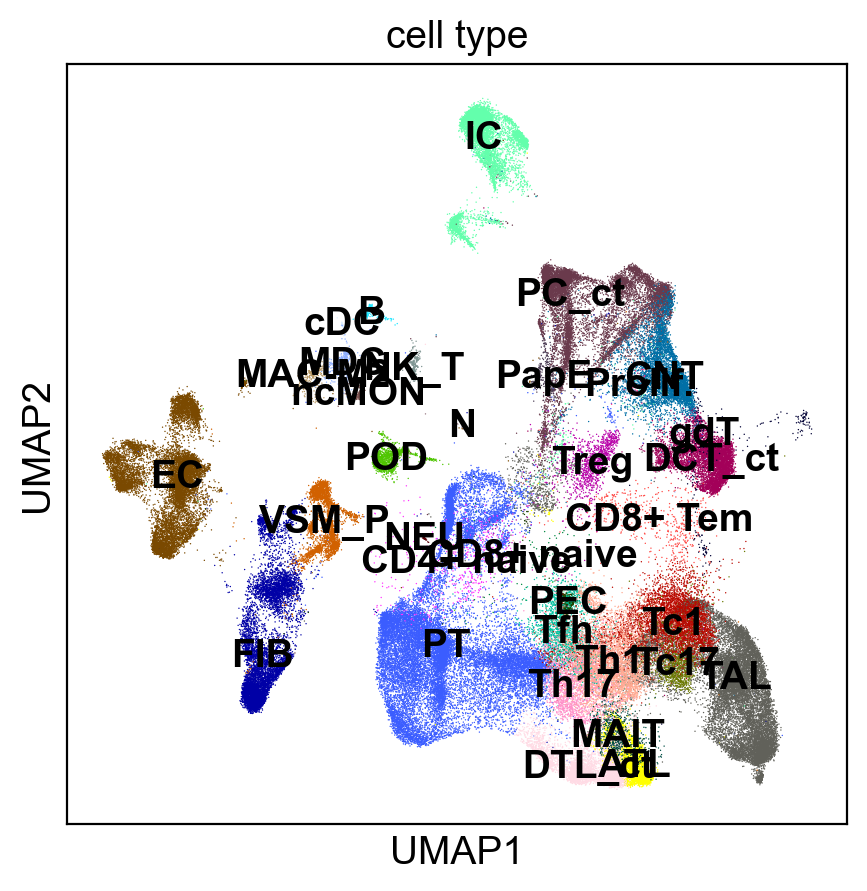

In [45]:
sc.pl.umap(adata_c_1, color="cell_type", title="cell type", show=False, legend_loc="on data")

In [46]:
adata_c_1.obs["cell_type"].value_counts()

PT            24278
TAL           16705
EC            11388
PC_ct         10798
FIB            8341
IC             6884
CNT            5458
DCT_ct         5455
Th1            4625
Tc1            4370
DTL_ct         4228
VSM_P          2985
ATL            2865
Th17           1759
Tfh            1601
POD            1258
Treg           1155
Tc17            965
PEC             778
MAIT            597
CD8+ Tem        536
CD4+ naive      501
PapE            400
MDC             368
NK_T            289
MAC-M2          257
gdT             248
ncMON           149
B               124
CD8+ naive       69
Prolif.          38
NEU              35
N                28
cDC              27
Name: cell_type, dtype: int64

In [47]:
adata_c[:, adata_c_1.var_names].write(os.path.join(datadir, "single_cell_atlas_kidney_cells.h5ad"))
adata_rna[:, adata_c_1.var_names].write(os.path.join(datadir, "single_cell_atlas_t_cells.h5ad"))

-----

In [98]:
adata_sim_kidney = sc.read("../src/DISSECT/PropsSimulator/kidney_cells/simulated.h5ad")
adata_sim_tcells = sc.read("../src/DISSECT/PropsSimulator/t_cells/simulated.h5ad")
adata_sim = adata_sim_kidney.concatenate(adata_sim_tcells)
adata_sim.obs = adata_sim.obs.fillna(0)
adata_sim.write(os.path.join(datadir, "simulated.h5ad"))


In [99]:
sc.pp.normalize_total(adata_sim_tcells, target_sum=1e4)
sc.pp.normalize_total(adata_sim_kidney, target_sum=1e4)

sc.pp.log1p(adata_sim_tcells)
sc.pp.log1p(adata_sim_kidney)

In [100]:
sc.pp.highly_variable_genes(adata_sim_tcells)
sc.pp.highly_variable_genes(adata_sim_kidney)

sc.tl.pca(adata_sim_tcells)
sc.tl.pca(adata_sim_kidney)

In [101]:
sc.pp.neighbors(adata_sim_tcells)
sc.pp.neighbors(adata_sim_kidney)

In [102]:
sc.tl.umap(adata_sim_tcells)
sc.tl.umap(adata_sim_kidney)

In [104]:
sc.set_figure_params(dpi=100)

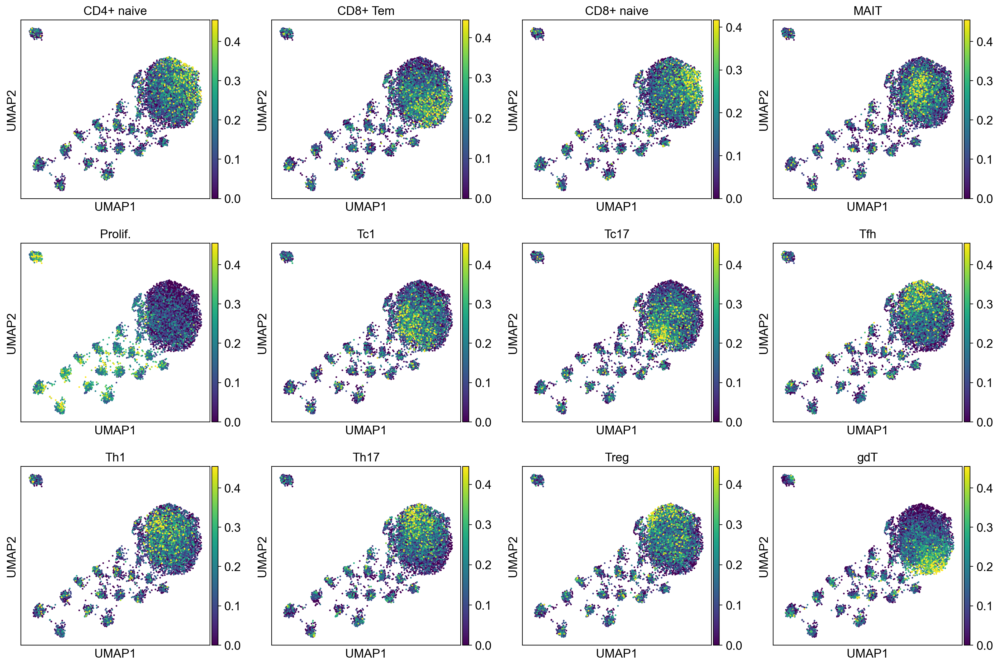

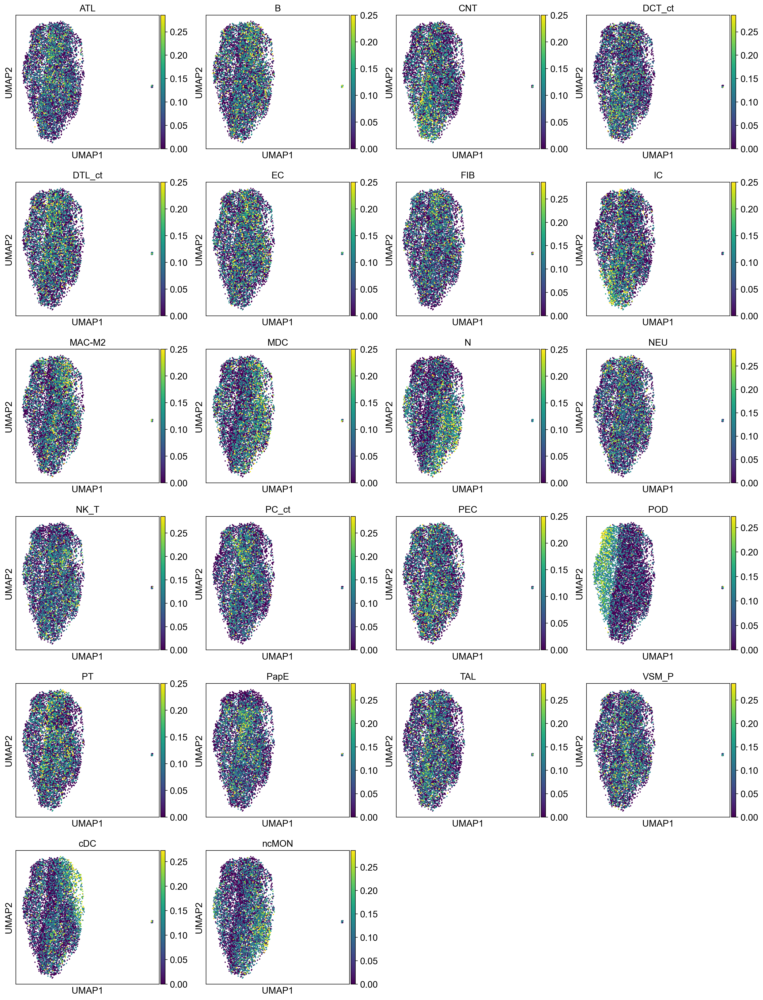

In [108]:
sc.pl.umap(adata_sim_tcells, color=adata_sim_tcells.obs.columns, vmax="p99")
sc.pl.umap(adata_sim_kidney, color=adata_sim_kidney.obs.columns, vmax="p99")

-----

In [109]:
adata_st = sc.read(os.path.join(datadir, "anca_samples_annotated_v2.h5ad"))

In [110]:
adata_st = adata_st.raw.to_adata()
adata_st.X = np.array(adata_st.X.todense())

In [18]:
adata_st.write(os.path.join(datadir, "anca_samples_annotated_v2_raw.h5ad"))

-----

In [149]:
from sklearn.preprocessing import StandardScaler

In [156]:
adata_st = sc.read(os.path.join(datadir, "anca_samples_annotated_v2_raw.h5ad"))


In [157]:
df_ct = pd.read_table("../src/DISSECT/experiment/dissect_fractions_1.txt", index_col=0)
# df_ct[df_ct<0.01] = 0
df_ct = pd.DataFrame(StandardScaler().fit_transform(df_ct), index=df_ct.index, columns=df_ct.columns)
adata_st.obs = pd.concat([adata_st.obs, df_ct],
                         axis=1)

In [158]:
# adata_st.obs[["cluster_annot"]+cols].groupby("cluster_annot").agg("mean")


In [159]:
cols = df_ct.columns.tolist()

In [160]:
sc.set_figure_params(dpi=100)

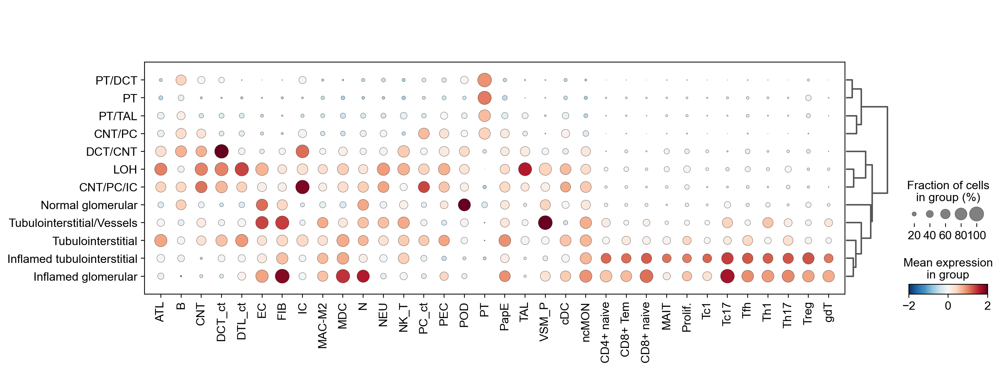

In [161]:
sc.pl.dotplot(adata_st, var_names=cols, groupby="cluster_annot", use_raw=False, cmap="RdBu_r", vmin=-2, vmax=2, dendrogram=True)

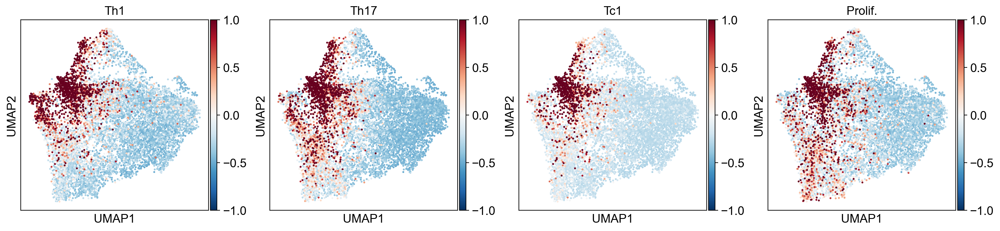

In [162]:
sc.pl.umap(adata_st, color=["Th1", "Th17", "Tc1", "Prolif."], s=20, cmap="RdBu_r", vcenter=0, vmin=-1, vmax=1)

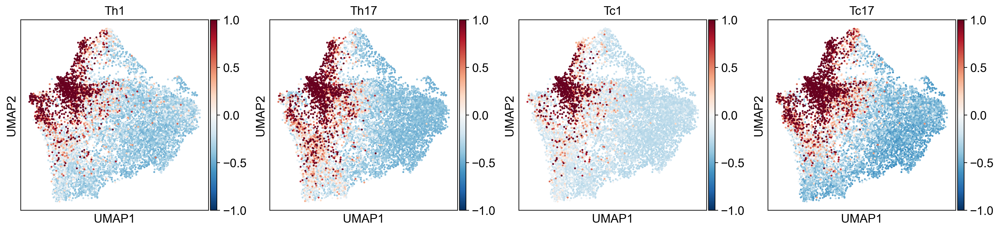

In [163]:
sc.pl.umap(adata_st, color=["Th1", "Th17", "Tc1", "Tc17"], s=20, cmap="RdBu_r", vcenter=0, vmin=-1, vmax=1)

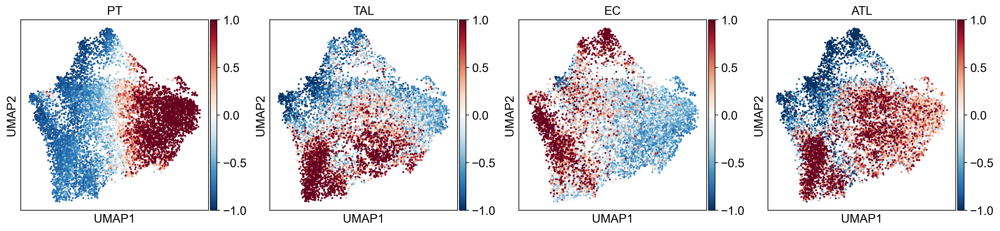

In [93]:
sc.pl.umap(adata_st, color=["PT", "TAL", "EC", "ATL"], s=20, vcenter=0, vmin=-1, vmax=1, cmap="RdBu_r")

In [ ]:
sc.pl.umap(adata_st, color=["PT", "TAL", "EC", "ATL"], vmax="p99", s=20, cmap="turbo")

In [ ]:
sc.pl.dotplot(adata_st, var_names=cols, groupby="cluster_annot", use_raw=False, cmap="RdBu_r", vmin=-1, vmax=1, dendrogram=True)